In [120]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
pd.set_option('display.max_columns',None)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression as LRN
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.utils import resample
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression as LinReg
from sklearn.metrics import mean_absolute_error as mae

In [2]:
numerical = pd.read_csv('numerical.csv')
numerical.head()

,TCODE,AGE,INCOME,WEALTH1,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,WEALTH2,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,CLUSTER2
0,0,60.000000,5,9,0,0,39,34,18,10,2,1,5,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,27,74,6,14,240.0,31,14,5.0,12.0,10.0,4,7.741935,95515,0,4,39
1,1,46.000000,6,9,16,0,15,55,11,6,2,1,9,3611,940,998,99,0,0,50,50,67,0,0,31,6,4,2,6,4,14,0,0,2,0,1,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,6,2,5,15,14,13,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,0,0,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,99,99,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,0,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,2,160,5,5,12,21,7,30,20,14,24,4,24,10,0,0,0,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,0,0,96,0,4,0,0,0,99,0,99,99,99,20,4,6,5,12,32,6,13,47.0,3,1,10.0,25.0,25.0,18,15.666667,148535,0,2,1
2,1,61.611649,3,1,2,0,20,29,33,6,8,1,1,7001,2040,2669,0,2,98,49,51,96,2,0,0,2,0,0,0,0,0,0,0,2,0,0,0,35,43,46,37,45,49,23,35,40,25,13,20,19,16,13,10,8,15,14,30,22,19,25,10,23,21,35,44,22,6,2,63,9,9,19,183,254,69,69,1,6,5,3,3,3,0,497,546,2,1,78,22,93,7,18,36,76,65,30,86,14,7,2,5,11,17,3,17,60,18,0,1,0,0,1,6,18,50,0,4,36,49,51,14,5,4,2,24,11,2,3,6,0,2,9,44,0.0,281.0,518.0,251,292,292,340,11576,32,18,20,15,12,2,0,0,1,20,19,24,18,16,2,0,0,1,28,8,31,11,38,62,8,74,22,0,0,0,0,0,2,2,1,21,19,24,6,61,65,73,59,70,56,78,62,82,99,4,10,5,2,6,12,0,1,9,5,18,20,5,7,6,0,11,33,4,3,2,12,3,3

In [3]:
numerical.shape

(95412, 315)

In [4]:
categorical = pd.read_csv('categorical.csv')
categorical.head()

,STATE,CLUSTER,HOMEOWNR,GENDER,DATASRCE,RFA_2R,RFA_2A,GEOCODE2,DOMAIN_A,DOMAIN_B,ODATEW_YR,ODATEW_MM,DOB_YR,DOB_MM,MINRDATE_YR,MINRDATE_MM,MAXRDATE_YR,MAXRDATE_MM,LASTDATE_YR,LASTDATE_MM,FIRSTDATE_YR,FIRSTDATE_MM
0,IL,36,H,F,3,L,E,C,T,2,89,1,37,12,92,8,94,2,95,12,89,11
1,CA,14,H,M,3,L,G,A,S,1,94,1,52,2,93,10,95,12,95,12,93,10
2,NC,43,U,M,3,L,E,C,R,2,90,1,0,2,91,11,92,7,95,12,90,1
3,CA,44,U,F,3,L,E,C,R,2,87,1,28,1,87,11,94,11,95,12,87,2
4,FL,16,H,F,3,L,F,A,S,2,86,1,20,1,93,10,96,1,96,1,79,3


In [5]:
categorical.shape

(95412, 22)

In [6]:
TARGET = pd.read_csv('target.csv')
TARGET.head()

,TARGET_B,TARGET_D
0,0,0.0
1,0,0.0
2,0,0.0
3,0,0.0
4,0,0.0


In [7]:
TARGET.shape

(95412, 2)

In [8]:
## before splitting, and verifying the columns, I will concatinate to all data. 

In [9]:
concat_df = pd.concat([categorical, numerical,TARGET],axis=1)
concat_df.reset_index(drop=True, inplace=True)
concat_df.head()

,STATE,CLUSTER,HOMEOWNR,GENDER,DATASRCE,RFA_2R,RFA_2A,GEOCODE2,DOMAIN_A,DOMAIN_B,ODATEW_YR,ODATEW_MM,DOB_YR,DOB_MM,MINRDATE_YR,MINRDATE_MM,MAXRDATE_YR,MAXRDATE_MM,LASTDATE_YR,LASTDATE_MM,FIRSTDATE_YR,FIRSTDATE_MM,TCODE,AGE,INCOME,WEALTH1,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,WEALTH2,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,CLUSTER2,TARGET_B,TARGET_D
0,IL,36,H,F,3,L,E,C,T,2,89,1,37,12,92,8,94,2,95,12,89,11,0,60.000000,5,9,0,0,39,34,18,10,2,1,5,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,27,74,6,14,240.0,31,14,5.0,12.0,10.0,4,7.741935,95515,0,4,39,0,0.0
1,CA,14,H,M,3,L,G,A,S,1,94,1,52,2,93,10,95,12,95,12,93,10,1,46.000000,6,9,16,0,15,55,11,6,2,1,9,3611,940,998,99,0,0,50,50,67,0,0,31,6,4,2,6,4,14,0,0,2,0,1,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,6,2,5,15,14,13,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,0,0,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,99,99,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,0,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,2,160,5,5,12,21,7,30,20,14,24,4,24,10,0,0,0,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,0,0,96,0,4,0,0,0,99,0,99,99,99,20,4,6,5,12,32,6,13,47.0,3,1,10.0,25.0,25.0,18,15.666667,148535,0,2,1,0,0.0
2,NC,43,U,M,3,L,E,C,R,2,90,1,0,2,91,11,92,7,95,12,90,1,1,61.611649,3,1,2,0,20,29,33,6,8,1,1,7001,2040,2669,0,2,98,49,51,96,2,0,0,2,0,0,0,0,0,0,0,2,0,0,0,35,43,46,37,45,49,23,35,40,25,13,20,19,16,13,10,8,15,14,30,22,19,25,10

In [10]:
concat_df.shape

(95412, 339)

In [11]:
pd.set_option('display.max_rows',None)
print(concat_df.dtypes)

STATE            object
CLUSTER           int64
HOMEOWNR         object
GENDER           object
DATASRCE          int64
RFA_2R           object
RFA_2A           object
GEOCODE2         object
DOMAIN_A         object
DOMAIN_B          int64
ODATEW_YR         int64
ODATEW_MM         int64
DOB_YR            int64
DOB_MM            int64
MINRDATE_YR       int64
MINRDATE_MM       int64
MAXRDATE_YR       int64
MAXRDATE_MM       int64
LASTDATE_YR       int64
LASTDATE_MM       int64
FIRSTDATE_YR      int64
FIRSTDATE_MM      int64
TCODE             int64
AGE             float64
INCOME            int64
WEALTH1           int64
HIT               int64
MALEMILI          int64
MALEVET           int64
VIETVETS          int64
WWIIVETS          int64
LOCALGOV          int64
STATEGOV          int64
FEDGOV            int64
WEALTH2           int64
POP901            int64
POP902            int64
POP903            int64
POP90C1           int64
POP90C2           int64
POP90C3           int64
POP90C4         

In [12]:
for column in concat_df.columns:
    print(f"Value counts for column '{column}':")
    print(concat_df[column].value_counts())
    print()

Value counts for column 'STATE':
STATE
other    30457
CA       17343
FL        8376
TX        7535
IL        6420
MI        5654
NC        4160
WA        3577
GA        3403
IN        2980
WI        2795
MO        2712
Name: count, dtype: int64

Value counts for column 'CLUSTER':
CLUSTER
40    6295
35    3624
36    3617
27    3553
24    3539
49    3315
12    3000
18    2897
13    2706
30    2607
39    2601
45    2515
43    2385
11    2378
51    2322
14    2246
41    2176
44    1953
16    1947
2     1942
21    1891
8     1828
10    1804
46    1800
28    1630
17    1621
20    1568
53    1441
3     1428
34    1358
42    1358
23    1324
31    1285
22    1282
25    1275
38    1200
15    1173
1     1140
7     1076
5     1014
37     972
26     947
47     868
29     859
32     795
48     787
50     776
9      770
6      603
33     593
4      561
19     497
52     270
Name: count, dtype: int64

Value counts for column 'HOMEOWNR':
HOMEOWNR
H    74582
U    20830
Name: count, dtype: int64

Value c

POP903
0        817
340      174
485      164
380      163
381      163
372      162
330      161
397      159
375      158
311      157
403      156
339      156
406      156
328      156
373      155
407      155
356      155
411      154
412      154
426      154
423      154
390      153
409      153
389      153
322      152
405      152
364      151
467      151
343      151
418      150
316      150
352      149
353      149
424      149
493      148
341      148
301      148
428      148
358      148
386      147
344      147
361      146
395      146
354      146
415      146
370      146
408      146
365      146
376      146
384      145
342      144
350      144
396      143
379      143
320      143
410      143
374      142
438      142
312      142
391      141
385      141
398      141
387      141
331      140
299      140
429      140
326      140
305      139
447      139
393      139
318      139
419      139
377      138
434      138
368      138
359      138
351  

IC5
0         860
22875      41
13103      27
12577      26
10931      26
17344      25
11576      25
13560      25
10164      25
12452      25
13765      24
13159      24
18858      24
9540       23
11709      23
15685      23
15111      23
10467      23
10643      23
12932      22
10885      22
17259      22
11450      22
13687      22
12781      22
10356      22
10573      22
13568      22
10740      22
9845       21
13852      21
13078      21
12736      21
10910      21
11723      21
9690       21
10771      21
14258      21
11076      21
12145      21
10940      21
11741      21
11733      21
18625      21
11833      21
11264      21
11261      21
13212      20
12893      20
13116      20
13545      20
15626      20
11963      20
11462      20
12224      20
13239      20
12315      20
12137      20
10895      20
11472      20
9984       20
10904      20
10850      20
13498      20
11052      20
12987      20
10466      19
12919      19
10654      19
12592      19
11918      19
11

ANC3
0     43506
1     36460
2      9738
3      2840
4      1106
5       534
6       310
7       230
8       177
9       147
10       88
11       67
12       55
13       30
14       23
17       22
15       17
16       16
18       10
19        8
20        6
23        5
25        5
21        4
24        2
30        1
27        1
26        1
31        1
29        1
22        1
Name: count, dtype: int64

Value counts for column 'ANC4':
ANC4
7     7390
8     7267
6     7010
5     6455
9     6373
10    6041
4     5552
11    5009
3     4669
12    4164
0     3969
13    3618
2     3577
14    3021
1     2730
15    2494
16    1975
17    1748
18    1523
19    1232
20    1061
21     934
22     817
23     743
24     610
25     534
26     451
27     431
28     359
29     328
30     315
31     267
32     240
33     240
34     209
35     185
36     167
38     150
39     145
37     141
40     122
41     107
42      98
44      88
47      75
43      72
46      70
45      66
48      51
49      47
52      4

AVGGIFT
15.000000      6020
20.000000      4566
25.000000      2659
10.000000      2227
12.500000      1800
13.000000      1368
9.000000       1147
11.000000       989
12.000000       888
14.000000       884
17.500000       785
11.666667       756
8.000000        733
7.000000        618
10.500000       602
13.333333       598
16.000000       546
10.333333       544
11.500000       498
22.500000       491
10.666667       473
6.000000        453
18.000000       443
12.333333       431
9.500000        427
16.666667       416
8.333333        409
7.500000        401
5.000000        365
23.000000       364
8.500000        360
17.000000       353
30.000000       345
18.333333       328
8.750000        324
11.250000       317
9.333333        299
9.666667        288
8.666667        287
7.333333        286
50.000000       278
13.666667       270
13.750000       268
11.750000       261
6.666667        254
13.500000       247
27.500000       244
10.250000       237
7.666667        237
6.500000    

CONTROLN
95515     1
16713     1
142025    1
1290      1
119028    1
187465    1
98557     1
56055     1
62613     1
151143    1
73912     1
97939     1
171799    1
159458    1
114067    1
20277     1
55341     1
108489    1
63430     1
178703    1
26572     1
123719    1
169456    1
590       1
175360    1
84618     1
180749    1
152579    1
96751     1
31806     1
186336    1
176510    1
23814     1
77875     1
132954    1
71645     1
91109     1
96779     1
110831    1
88253     1
188165    1
59192     1
150141    1
183412    1
8669      1
56668     1
69465     1
23040     1
70841     1
81664     1
18401     1
15586     1
122227    1
139869    1
40211     1
94165     1
66240     1
65844     1
160957    1
47867     1
159741    1
134329    1
140988    1
59588     1
4372      1
91969     1
83611     1
150337    1
137340    1
84228     1
38326     1
48573     1
59646     1
161495    1
108780    1
144788    1
68321     1
132179    1
33787     1
16430     1
6232      1
166018    1
37625  

In [13]:
cols2drop = concat_df[['DOB_YR','DOB_MM','ODATEW_MM','TCODE']]

In [14]:
concat_df.drop(columns=cols2drop, inplace=True)

In [15]:
concat_df['ODATEW_YR'] = concat_df['ODATEW_YR'].replace([85,84,83],86)

In [16]:
concat_df['ODATEW_YR'].value_counts()

ODATEW_YR
95    15369
86    14605
94    12069
96    10122
91     8557
90     7724
92     7549
88     6671
89     5347
93     3929
87     3455
97       15
Name: count, dtype: int64

In [17]:
for column in concat_df.columns:
    print(f"Value counts for column '{column}':")
    print(concat_df[column].value_counts())
    print()

Value counts for column 'STATE':
STATE
other    30457
CA       17343
FL        8376
TX        7535
IL        6420
MI        5654
NC        4160
WA        3577
GA        3403
IN        2980
WI        2795
MO        2712
Name: count, dtype: int64

Value counts for column 'CLUSTER':
CLUSTER
40    6295
35    3624
36    3617
27    3553
24    3539
49    3315
12    3000
18    2897
13    2706
30    2607
39    2601
45    2515
43    2385
11    2378
51    2322
14    2246
41    2176
44    1953
16    1947
2     1942
21    1891
8     1828
10    1804
46    1800
28    1630
17    1621
20    1568
53    1441
3     1428
34    1358
42    1358
23    1324
31    1285
22    1282
25    1275
38    1200
15    1173
1     1140
7     1076
5     1014
37     972
26     947
47     868
29     859
32     795
48     787
50     776
9      770
6      603
33     593
4      561
19     497
52     270
Name: count, dtype: int64

Value counts for column 'HOMEOWNR':
HOMEOWNR
H    74582
U    20830
Name: count, dtype: int64

Value c

POP902
0        842
296      225
265      217
261      217
281      215
268      214
241      213
225      211
237      208
257      207
230      205
278      204
239      204
269      202
255      201
275      201
276      200
234      200
195      197
300      197
228      195
305      195
277      194
317      194
263      193
223      193
302      192
213      191
326      190
285      190
349      190
322      189
310      189
280      188
251      188
245      187
227      187
273      187
311      187
247      187
243      184
256      183
224      183
262      182
221      182
286      182
248      182
284      182
210      181
323      181
301      181
325      181
238      180
242      180
264      180
270      179
222      178
258      178
303      177
226      177
292      176
290      176
229      176
279      175
316      175
254      175
342      175
339      174
308      174
271      174
313      174
218      174
266      174
212      173
340      173
321      173
274  

HHN5
9     8221
10    8029
8     7855
11    7475
7     6837
6     6045
12    6023
13    5448
5     4802
14    4261
4     3915
15    3455
3     2895
16    2659
2     2242
0     2069
17    2065
1     1623
18    1571
19    1287
20    1020
21     806
22     697
23     568
24     424
25     387
26     349
27     287
28     250
29     233
30     195
31     158
32     139
33     124
34     109
37     102
36      97
35      88
38      79
39      66
40      62
41      61
42      57
43      43
45      37
44      32
46      28
47      19
50      18
48      12
49      12
52      12
51       8
59       8
55       7
99       6
54       5
58       5
53       4
57       3
67       3
60       3
56       3
66       2
62       2
64       2
65       1
69       1
61       1
Name: count, dtype: int64

Value counts for column 'HHN6':
HHN6
2     19536
3     19311
4     13636
1     12538
5      8191
0      5095
6      4958
7      3131
8      1963
9      1414
10      984
11      819
12      588
13      523
14  

HHD11
15    4693
14    4684
16    4599
13    4566
17    4490
12    4252
18    4125
19    4077
20    4033
11    3956
21    3785
10    3624
22    3542
23    3227
9     3210
24    2851
8     2595
25    2594
26    2221
7     2034
27    2027
28    1915
29    1741
6     1528
30    1517
31    1263
32    1122
33    1090
5     1046
0      952
34     894
35     816
4      664
36     612
37     562
38     514
40     438
39     437
3      349
41     305
42     268
43     244
44     224
45     195
2      180
47     162
46     162
49     151
48     127
50      87
1       79
52      79
51      59
53      57
54      56
55      52
56      32
57      31
61      27
60      23
59      22
58      21
63      20
64      17
65      14
99      11
62       8
66       8
70       7
71       7
67       6
69       4
72       4
75       4
68       3
78       2
74       2
73       2
85       2
76       1
80       1
84       1
Name: count, dtype: int64

Value counts for column 'HHD12':
HHD12
2     17311
3     16693
4 

IC4
0       928
344     370
320     350
325     347
346     346
338     343
313     343
343     343
329     338
330     336
311     331
345     330
361     328
308     325
324     325
303     324
296     324
366     322
306     321
328     321
378     320
348     320
374     320
319     319
304     315
300     314
332     310
307     310
364     310
339     310
333     309
309     309
314     309
377     308
327     308
323     308
284     308
353     307
302     306
286     304
317     303
365     302
340     302
400     302
318     301
312     301
316     296
382     296
326     296
282     295
334     294
362     294
357     293
386     293
399     293
392     290
380     290
337     290
405     290
336     290
351     290
376     289
384     289
335     288
310     288
359     288
288     287
372     287
331     287
387     285
279     285
398     284
381     284
341     284
371     284
297     283
375     283
299     281
388     280
352     278
322     278
321     278
356     277


HHAS4
3     6631
4     6537
5     6276
2     6222
6     5281
1     5195
7     5087
8     4548
9     4361
0     4357
10    3941
11    3440
12    3296
13    3018
14    2580
15    2490
16    2236
17    1963
18    1862
19    1730
20    1455
21    1330
22    1120
23    1094
24     913
25     812
26     734
27     674
28     575
29     498
30     477
31     421
32     375
33     340
34     315
35     302
36     272
37     242
38     220
39     207
41     176
40     168
42     156
43     150
44     147
46     108
45     104
47      91
48      88
49      78
50      73
51      60
52      59
55      51
53      43
57      41
56      38
58      35
54      33
60      32
61      24
59      23
62      22
68      21
67      18
64      15
63      15
65      15
69      11
70       9
66       9
73       8
71       7
76       7
72       7
75       7
99       7
87       4
79       4
74       3
84       2
91       2
86       2
92       2
77       2
85       1
78       1
93       1
89       1
88       1
81  

VC3
0     2912
32    2572
33    2467
28    2452
36    2442
31    2432
35    2405
29    2383
34    2378
30    2338
38    2328
26    2297
27    2285
39    2270
37    2247
25    2182
24    2168
40    2052
23    1979
22    1912
41    1888
21    1827
20    1799
19    1781
42    1722
43    1671
18    1627
44    1581
17    1579
45    1496
47    1431
46    1420
16    1412
14    1266
48    1255
15    1220
13    1155
49    1154
50    1153
51    1081
12    1025
10     941
53     940
11     933
52     903
55     811
9      767
54     763
8      757
56     733
57     672
59     628
58     621
7      615
6      487
63     481
61     479
60     452
5      442
64     408
62     408
69     355
65     343
66     335
67     313
4      311
68     303
70     228
71     214
72     206
99     193
74     186
73     180
75     178
3      176
78     159
76     140
77     123
81     113
79     110
82     109
83      99
80      98
2       87
86      74
89      71
84      63
85      45
88      42
87      41
90    

NGIFTALL
1      10008
2       7722
3       7189
4       7019
5       6293
6       5675
7       5190
8       4641
9       4077
10      3903
11      3580
12      3371
13      3038
14      2786
15      2525
16      2294
17      1991
18      1805
19      1558
20      1375
21      1145
22       971
23       883
24       748
25       662
26       531
27       501
28       454
29       373
30       344
32       276
31       274
33       254
34       216
35       175
36       160
37       144
38       131
39       123
41       100
42        92
40        92
43        89
44        82
45        71
46        57
48        51
47        49
49        33
50        30
52        28
54        26
53        25
51        21
60        17
55        16
56        15
58        13
61        11
57        10
62         8
59         7
67         7
68         6
66         5
64         5
69         5
77         4
63         4
75         3
73         2
72         2
76         2
80         2
89         2
71         2
65 

CONTROLN
95515     1
16713     1
142025    1
1290      1
119028    1
187465    1
98557     1
56055     1
62613     1
151143    1
73912     1
97939     1
171799    1
159458    1
114067    1
20277     1
55341     1
108489    1
63430     1
178703    1
26572     1
123719    1
169456    1
590       1
175360    1
84618     1
180749    1
152579    1
96751     1
31806     1
186336    1
176510    1
23814     1
77875     1
132954    1
71645     1
91109     1
96779     1
110831    1
88253     1
188165    1
59192     1
150141    1
183412    1
8669      1
56668     1
69465     1
23040     1
70841     1
81664     1
18401     1
15586     1
122227    1
139869    1
40211     1
94165     1
66240     1
65844     1
160957    1
47867     1
159741    1
134329    1
140988    1
59588     1
4372      1
91969     1
83611     1
150337    1
137340    1
84228     1
38326     1
48573     1
59646     1
161495    1
108780    1
144788    1
68321     1
132179    1
33787     1
16430     1
6232      1
166018    1
37625  

In [18]:
# drop all rows that have values of 85 below or equael - 
columns_to_check = ['MINRDATE_YR', 'MAXRDATE_YR', 'FIRSTDATE_YR']
concat_df = concat_df[(concat_df[columns_to_check] > 85).all(axis=1)]
# Age - drop all ages under 21
columns_to_check2 = ['AGE']
concat_df = concat_df[(concat_df[columns_to_check2] > 21).all(axis=1)]


In [19]:
for column in concat_df.columns:
    print(f"Value counts for column '{column}':")
    print(concat_df[column].value_counts())
    print()

Value counts for column 'STATE':
STATE
other    30408
CA       17301
FL        8345
TX        7522
IL        6398
MI        5636
NC        4152
WA        3571
GA        3399
IN        2974
WI        2793
MO        2702
Name: count, dtype: int64

Value counts for column 'CLUSTER':
CLUSTER
40    6281
35    3615
36    3610
27    3546
24    3529
49    3309
12    2994
18    2894
13    2698
30    2601
39    2597
45    2510
43    2382
11    2376
51    2320
14    2241
41    2169
44    1952
16    1937
2     1936
21    1887
8     1824
10    1803
46    1798
28    1625
17    1618
20    1564
53    1439
3     1424
42    1356
34    1353
23    1318
31    1283
22    1277
25    1272
38    1198
15    1168
1     1136
7     1075
5     1008
37     968
26     946
47     868
29     856
32     794
48     785
50     775
9      766
6      602
33     593
4      558
19     497
52     270
Name: count, dtype: int64

Value counts for column 'HOMEOWNR':
HOMEOWNR
H    74412
U    20789
Name: count, dtype: int64

Value c

POP902
0        842
296      223
265      216
281      215
268      214
241      213
261      213
225      210
237      207
257      207
239      204
278      203
269      201
230      201
255      201
275      201
234      200
276      200
300      197
195      197
305      195
277      194
317      194
228      193
223      192
263      192
302      192
213      191
349      190
285      190
322      189
310      189
251      188
326      188
247      187
227      187
311      186
273      186
245      186
280      185
243      184
224      183
221      182
256      182
262      182
286      182
323      181
248      181
301      181
284      181
325      181
238      180
210      180
242      180
264      180
270      179
222      178
226      177
290      176
258      176
229      176
303      176
292      176
316      175
254      175
342      175
271      174
279      174
308      174
218      174
339      173
340      173
321      173
266      173
274      173
212      173
313  

MARR4
19    7354
18    7336
20    7238
21    6684
17    5884
22    5862
23    5243
16    4489
24    4264
25    3975
26    3266
15    3183
27    2828
28    2358
29    2040
14    2025
30    1723
31    1591
32    1451
13    1284
33    1218
34    1170
35     951
36     918
12     865
0      816
37     761
38     668
11     610
39     570
40     553
41     470
10     405
42     404
43     356
9      340
44     315
45     265
5      231
8      218
47     215
7      203
46     202
50     190
4      187
48     183
6      167
49     149
51     130
3      120
52     120
53      98
54      97
56      87
59      84
2       79
55      71
57      58
58      52
61      40
64      38
60      38
62      37
63      29
68      23
69      22
65      21
74      21
67      20
66      20
70      19
72      17
75      17
83      14
71      13
79      12
73      12
77      11
80      11
99      10
88       8
78       8
81       8
91       5
97       5
95       5
76       4
92       4
89       4
1        4
94  

ETHC2
59    4436
60    4374
58    4332
56    4167
55    4159
61    4137
57    4137
62    3855
54    3820
53    3611
52    3451
63    3415
51    2985
50    2795
64    2740
49    2567
65    2291
48    2240
47    1948
46    1651
45    1651
66    1610
44    1490
43    1355
0     1306
42    1156
67    1097
40    1011
41     992
39     950
38     874
37     782
68     778
36     645
35     631
34     617
33     537
69     523
32     514
30     477
31     439
1      417
29     415
28     407
26     399
27     362
70     354
24     294
71     279
22     277
25     276
23     267
2      250
18     245
21     242
4      237
20     236
17     229
15     217
19     208
16     198
6      193
5      185
14     184
3      180
72     178
9      171
8      169
11     164
10     163
13     162
7      157
73     139
12     130
74     128
75      90
77      70
76      64
79      52
78      48
80      44
81      35
83      27
82      20
84      18
86      16
85      15
99      10
88       8
87       7
90  

IC5
0         860
22875      41
13103      27
10931      26
12577      26
11576      25
12452      25
10164      25
13560      25
13159      24
17344      24
18858      24
13765      24
10643      23
11709      23
10467      23
15685      23
15111      23
12781      22
9540       22
17259      22
11450      22
10740      22
10573      22
13687      22
10356      22
12932      22
10885      22
13568      22
9845       21
11733      21
13078      21
12145      21
11741      21
18625      21
11833      21
10940      21
10771      21
11076      21
11264      21
13852      21
11723      21
14258      21
11261      21
10910      21
9690       21
12736      21
13212      20
12987      20
10904      20
12224      20
10895      20
12893      20
13498      20
11472      20
11462      20
12137      20
13239      20
15626      20
13116      20
11052      20
10850      20
9984       20
12315      20
13545      20
12449      19
22696      19
10935      19
13168      19
9728       19
9358       19
11

VOC2
62    2187
64    2177
61    2158
67    2156
65    2141
66    2139
63    2077
70    2068
69    2064
68    2063
57    2053
71    2050
60    2039
58    2016
59    1997
73    1993
72    1938
74    1911
76    1897
55    1883
75    1847
56    1803
77    1727
54    1670
53    1668
52    1625
78    1574
51    1554
79    1475
49    1453
48    1442
80    1415
50    1399
81    1372
82    1291
83    1253
47    1230
46    1198
84    1180
45    1145
85    1107
86    1083
44    1066
43    1019
0      982
42     971
87     970
41     853
40     849
88     840
39     800
38     736
90     716
36     713
35     643
37     636
89     629
34     596
33     595
91     588
30     496
32     480
31     461
92     455
29     431
28     402
93     378
27     360
26     359
24     323
25     321
94     291
22     247
20     235
23     234
21     230
18     225
16     208
95     176
19     175
17     167
15     164
13     163
96     135
12     134
11     134
99     127
14     125
9      109
10     105
8    

AVGGIFT
15.000000      6015
20.000000      4559
25.000000      2658
10.000000      2226
12.500000      1796
13.000000      1367
9.000000       1145
11.000000       988
12.000000       887
14.000000       884
17.500000       784
11.666667       755
8.000000        732
7.000000        618
10.500000       602
13.333333       598
16.000000       546
10.333333       544
11.500000       498
22.500000       491
10.666667       472
6.000000        453
18.000000       443
12.333333       431
9.500000        427
16.666667       416
8.333333        409
7.500000        401
5.000000        365
23.000000       364
8.500000        359
17.000000       353
30.000000       344
18.333333       328
8.750000        323
11.250000       317
9.333333        299
9.666667        288
7.333333        286
8.666667        286
50.000000       278
13.666667       270
13.750000       267
11.750000       261
6.666667        254
13.500000       247
27.500000       243
7.666667        237
10.250000       237
14.500000   

CONTROLN
95515     1
26572     1
16713     1
97939     1
159458    1
114067    1
20277     1
55341     1
108489    1
63430     1
178703    1
123719    1
77875     1
56668     1
171799    1
69465     1
47867     1
161495    1
108780    1
144788    1
68321     1
132179    1
73912     1
151143    1
62613     1
56055     1
71645     1
91109     1
96779     1
110831    1
88253     1
188165    1
59192     1
150141    1
183412    1
8669      1
84618     1
175360    1
590       1
169456    1
142025    1
1290      1
119028    1
187465    1
98557     1
33787     1
16430     1
6232      1
65844     1
160957    1
159741    1
134329    1
140988    1
59588     1
4372      1
91969     1
83611     1
150337    1
137340    1
93620     1
32137     1
180399    1
144966    1
64040     1
59900     1
156407    1
141580    1
13158     1
70841     1
66240     1
166018    1
94165     1
37625     1
49261     1
81621     1
44191     1
46902     1
3327      1
66357     1
87272     1
94439     1
59646     1
48573  

In [20]:
# concat_df.ODATEW_MM.value_counts()/len(concat_df)
# # for loop 0.01 less then 1% of the total rows is low value, print the column name. 

In [21]:
# # Calculate the threshold for low value counts
# threshold = 0.001 * len(concat_df)

# # Iterate over each column
# for column in concat_df.columns:
#     # Calculate value counts for the column
#     value_counts = concat_df[column].value_counts()
#     # Check if the count of the least frequent value is less than the threshold
#     if value_counts.min() < threshold:
#         print(f"Column '{column}' has low value-count.")


In [22]:
missing_values_per_column = concat_df.isna().sum()
print(missing_values_per_column)

STATE           0
CLUSTER         0
HOMEOWNR        0
GENDER          0
DATASRCE        0
RFA_2R          0
RFA_2A          0
GEOCODE2        0
DOMAIN_A        0
DOMAIN_B        0
ODATEW_YR       0
MINRDATE_YR     0
MINRDATE_MM     0
MAXRDATE_YR     0
MAXRDATE_MM     0
LASTDATE_YR     0
LASTDATE_MM     0
FIRSTDATE_YR    0
FIRSTDATE_MM    0
AGE             0
INCOME          0
WEALTH1         0
HIT             0
MALEMILI        0
MALEVET         0
VIETVETS        0
WWIIVETS        0
LOCALGOV        0
STATEGOV        0
FEDGOV          0
WEALTH2         0
POP901          0
POP902          0
POP903          0
POP90C1         0
POP90C2         0
POP90C3         0
POP90C4         0
POP90C5         0
ETH1            0
ETH2            0
ETH3            0
ETH4            0
ETH5            0
ETH6            0
ETH7            0
ETH8            0
ETH9            0
ETH10           0
ETH11           0
ETH12           0
ETH13           0
ETH14           0
ETH15           0
ETH16           0
AGE901    

In [23]:
concat_df.dropna(inplace=True)

In [24]:
col2object = ['DOMAIN_B','DATASRCE','ODATEW_YR', 'MINRDATE_YR', 'MINRDATE_MM','MAXRDATE_YR','MAXRDATE_MM','LASTDATE_YR','LASTDATE_MM','FIRSTDATE_YR','FIRSTDATE_MM']
concat_df[col2object] = concat_df[col2object].astype('object')

In [25]:
col2int = ['WEALTH2', 'WEALTH1', 'INCOME', 'MHUC2', 'HPHONE_D', 'RFA_2F']
concat_df[col2int] = concat_df[col2int].astype(int)

In [26]:
print(concat_df.dtypes)

STATE            object
CLUSTER           int64
HOMEOWNR         object
GENDER           object
DATASRCE         object
RFA_2R           object
RFA_2A           object
GEOCODE2         object
DOMAIN_A         object
DOMAIN_B         object
ODATEW_YR        object
MINRDATE_YR      object
MINRDATE_MM      object
MAXRDATE_YR      object
MAXRDATE_MM      object
LASTDATE_YR      object
LASTDATE_MM      object
FIRSTDATE_YR     object
FIRSTDATE_MM     object
AGE             float64
INCOME            int32
WEALTH1           int32
HIT               int64
MALEMILI          int64
MALEVET           int64
VIETVETS          int64
WWIIVETS          int64
LOCALGOV          int64
STATEGOV          int64
FEDGOV            int64
WEALTH2           int32
POP901            int64
POP902            int64
POP903            int64
POP90C1           int64
POP90C2           int64
POP90C3           int64
POP90C4           int64
POP90C5           int64
ETH1              int64
ETH2              int64
ETH3            

In [27]:
pd.reset_option('display.max_rows')

In [28]:
X = concat_df.drop(['TARGET_B', 'TARGET_D'],axis =1)
y = concat_df.TARGET_B

## Split

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [30]:
X_train_num = X_train.select_dtypes(include = np.number)
X_train_cat = X_train.select_dtypes(include = object)
X_test_num = X_test.select_dtypes(include = np.number)
X_test_cat = X_test.select_dtypes(include = object)

## Transform

In [31]:
transformer = MinMaxScaler().fit(X_train_num)
x_train_normalized = transformer.transform(X_train_num)
print(x_train_normalized.shape)
x_train_normalized
x_train_scaled = pd.DataFrame(x_train_normalized, columns=X_train_num.columns)

(76160, 315)


In [32]:
x_test_normalized = transformer.transform(X_test_num)
print(x_test_normalized.shape)
x_test_normalized
x_test_scaled = pd.DataFrame(x_test_normalized, columns=X_test_num.columns)

(19041, 315)


## Encoding

In [33]:
encoder = OneHotEncoder(drop = 'first')

X_train_cat_encoded = encoder.fit_transform(X_train_cat)
X_test_cat_encoded = encoder.transform(X_test_cat)

X_train_cat_encoded_df = pd.DataFrame(X_train_cat_encoded.toarray(), columns=encoder.get_feature_names_out(X_train_cat.columns))
X_test_cat_encoded_df = pd.DataFrame(X_test_cat_encoded.toarray(), columns=encoder.get_feature_names_out(X_train_cat.columns))

X_train = pd.concat([x_train_scaled, X_train_cat_encoded_df], axis=1)
X_test = pd.concat([x_test_scaled, X_test_cat_encoded_df], axis=1)

In [34]:
# X_train = X_train.dropna()
X_train.shape

(76160, 433)

In [35]:
# y_train =y_train.dropna()
y_train.shape

(76160,)

In [36]:
# X_test = X_test.dropna()
X_test.shape

(19041, 433)

In [37]:
# y_test =y_test.dropna()
y_test.shape

(19041,)

## Logistic Regression 

In [41]:
logistic_model = LogisticRegression()

In [42]:
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)

Shape of X_train: (76160, 433)
Shape of y_train: (76160,)


In [43]:
logistic_model.fit(X_train, y_train)

C:\ANACONDA3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [44]:
y_pred = logistic_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy on test data:", accuracy)

Accuracy on test data: 0.9479544141589202


In [45]:
# Percision
# recall
# confusion matrix

print("precision: ",precision_score(y_test,y_pred))
print("recall: ",recall_score(y_test,y_pred))

precision:  0.0
recall:  0.0


C:\ANACONDA3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [46]:
LR_confusion_matrix = confusion_matrix(y_test,y_pred)  #Always Actual,Predicted
LR_confusion_matrix

array([[18050,     0],
       [  991,     0]], dtype=int64)

## Managing imbalance in the dataset

In [47]:
y_train.reset_index(drop = True, inplace = True)

In [48]:
# First concat the Xtrain
trainset = pd.concat([X_train, y_train], axis=1) 

In [49]:
trainset

,CLUSTER,AGE,INCOME,WEALTH1,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,WEALTH2,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,CLUSTER2,STATE_FL,STATE_GA,STATE_IL,STATE_IN,STATE_MI,STATE_MO,STATE_NC,STATE_TX,STATE_WA,STATE_WI,STATE_other,HOMEOWNR_U,GENDER_M,GENDER_other,DATASRCE_2,DATASRCE_3,RFA_2A_E,RFA_2A_F,RFA_2A_G,GEOCODE2_B,GEOCODE2_C,GEOCODE2_D,DOMAIN_A_R,DOMAIN_A_S,DOMAIN_A_T,DOMAIN_A_U,DOMAIN_B_2,DOMAIN_B_3,DOMAIN_B_4,ODATEW_YR_87,ODATEW_YR_88,ODATEW_YR_89,ODATEW_YR_90,ODATEW_YR_91,ODATEW_YR_92,ODATEW_YR_93,ODATEW_YR_94,ODATEW_YR_95,ODATEW_YR_96,ODATEW_YR_97,MINRDATE_YR_87,MINRDATE_YR_88,MINRDATE_YR_89,MINRDATE_YR_90,MINRDATE_YR_91,MINRDATE_YR_92,MINRDATE_YR_93,MINRDATE_YR_94,MINRDATE_YR_95,MINRDATE_YR_96,MINRDATE_YR_97,MINRDATE_MM_2,MINRDATE_MM_3,MINRDATE_MM_4,MINRDATE_MM_5,MINRDATE_MM_6,MINRDATE_MM_7,MINRDATE_MM_8,MINRDATE_MM_9,MINRDATE_MM_10,MINRDATE_MM_11,MINRDATE_MM_12,MAXRDATE_YR_87,MAXRDATE_YR_88,MAXRDATE_YR_89,MAXRDATE_YR_90,MAXRDATE_YR_91,MAXRDATE_YR_92,MAXRDATE_YR_93,MAXRDATE_YR_94,MAXRDATE_YR_95,MAXRDATE_YR_96,MAXRDATE_YR_97,MAXRDATE_MM_2,MAXRDATE_MM_3,MAXRDATE_MM_4,MAXRDATE_MM_5,MAXRDATE_MM_6,MAXRDATE_MM_7,MAXRDATE_MM_8,MAXRDATE_MM_9,MAXRDATE_MM_10,MAXRDATE_MM_11,MAXRDATE_MM_12,LASTDATE_YR_96,LASTDATE_YR_97,LASTDATE_MM_2,LASTDATE_MM_3,LASTDATE_MM_4,LASTDATE_MM_5,LASTDATE_MM_6,LASTDATE_MM_7,LASTDATE_MM_8,LASTDATE_MM_9,LASTDATE_MM_10,LASTDATE_MM_11,LASTDATE_MM_12,FIRSTDATE_YR_87,FIRSTDATE_YR_88,FIRSTDATE_YR_89,FIRSTDATE_YR_90,FIRSTDATE_YR_91,FIRSTDATE_YR_92,FIRSTDATE_YR_93,FIRSTDATE_YR_94,FIRSTDATE_YR_95,FIRSTDATE_YR_96,FIRSTDATE_MM_2,FIRSTDATE_MM_3,FIRSTDATE_MM_4,FIRSTDATE_MM_5,FIRSTDATE_MM_6,FIRSTDATE_MM_7,FIRSTDATE_MM_8,FIRSTDATE_MM_9,FIRSTDATE_MM_10,FIRSTDATE_MM_11,FIRSTDATE_MM_12,TARGET_B
0,0.442308,0.521206,0.666667,1.000000,0.000000,0.090909,0.373737,0.515152,0.171717,0.090909,0.027397,0.034483,1.000000,0.039929,0.046537,0.035731,0.686869,0.000000,0.323232,0.494949,0.515152,0.969697,0.020202,0.000000,0.010101,0.050505,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.020833,0.02,0.012821,0.011628,0.397590,0.493976,0.506024,0.395062,0.530864,0.555556,0.436620,0.373737,0.393939,0.232323,0.113402,0.191919,0.313131,0.191919,0.101010,0.060606,0.033333,0.151515,0.161616,0.323232,0.222222,0.151515,0.151515,0.050505,0.131313,0.101010,0.292929,0.616162,0.393939,0.131313,0.030303,0.707071,0.070707,0.054795,0.191919,0.386154,0.440000,0.848485,0.848485

In [50]:
category_0 = trainset[trainset['TARGET_B'] == 0]
category_1 = trainset[trainset['TARGET_B'] == 1]

#### Downsampling (undersampling)

In [51]:
category_0_undersampled = resample(category_0,
                                   replace=False,
                                   n_samples = len(category_1))

In [52]:
print(category_0_undersampled.shape)
print(category_1.shape)

(3831, 434)
(3831, 434)


In [53]:
data_downsampled = pd.concat([category_0_undersampled, category_1], axis=0)

In [54]:
data_downsampled['TARGET_B'].value_counts()

TARGET_B
0    3831
1    3831
Name: count, dtype: int64

#### Upsampling (oversampling)

In [55]:
category_1_oversampled = resample(category_1,
                                  replace=True,
                                  n_samples = len(category_0))

In [56]:
print(category_0.shape)
print(category_1_oversampled.shape)

(72329, 434)
(72329, 434)


In [57]:
data_upsampled = pd.concat([category_0, category_1_oversampled], axis=0)

In [58]:
data_upsampled['TARGET_B'].value_counts()

TARGET_B
0    72329
1    72329
Name: count, dtype: int64

## Fit the model and see how the accuracy of the model has changed ??

In [59]:
data_downsampled['TARGET_B'].value_counts()
y_train_down = data_downsampled['TARGET_B']
X_train_down = data_downsampled.drop('TARGET_B',axis = 1)

In [60]:
log_reg = LogisticRegression()
log_reg.fit(X_train_down, y_train_down)

y_pred = log_reg.predict(X_test.reset_index(drop=True))

accuracy = accuracy_score(y_test.reset_index(drop=True), y_pred)
print("Accuracy:", accuracy)
confusion_matrix(y_test, y_pred)

Accuracy: 0.5798014810146526


C:\ANACONDA3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


array([[10492,  7558],
       [  443,   548]], dtype=int64)

In [61]:
print("precision: ",precision_score(y_test,y_pred))
print("recall: ",recall_score(y_test,y_pred))

precision:  0.06760424377004688
recall:  0.5529767911200807


In [62]:
data_downsampled['TARGET_B'].value_counts()

TARGET_B
0    3831
1    3831
Name: count, dtype: int64

## Random Forest

In [63]:
y_upsampled = data_upsampled['TARGET_B']
X_upsampled = data_upsampled.drop(columns=['TARGET_B'])

In [64]:
# CLF always give 100 models 

clf = RandomForestClassifier(max_depth=5, # max number of questions to ask
                             min_samples_split=20, # amount of rows still considered at every question
                             min_samples_leaf =20, # ultimate answer based on at least this many rows
                             max_samples=0.8, # fraction of X-train to use in each tree
                             random_state=42)
clf.fit(X_upsampled, y_upsampled)

RandomForestClassifier(max_depth=5, max_samples=0.8, min_samples_leaf=20,
                       min_samples_split=20, random_state=42)

In [65]:
print('Accuracy Train : ', clf.score(X_upsampled, y_upsampled))
print('Accuracy Test : ', clf.score(X_test, y_test))

Accuracy Train :  0.624044297584648
Accuracy Test :  0.6064807520613413


In [66]:
y_pred = clf.predict(X_test)
print('y_test')
display(y_test.value_counts())
print('confusion_matrix')
display(confusion_matrix(y_test, y_pred))

y_test


TARGET_B
0    18050
1      991
Name: count, dtype: int64

confusion_matrix


array([[11013,  7037],
       [  456,   535]], dtype=int64)

#### Optimize the Random Forest

In [67]:
clf = RandomForestClassifier(max_depth=10, # max number of questions to ask
                             min_samples_split=20, # amount of rows still considered at every question
                             min_samples_leaf =20, # ultimate answer based on at least this many rows
                             max_samples=0.8, # fraction of X-train to use in each tree
                             random_state=42)
clf.fit(X_upsampled, y_upsampled)
print('Accuracy Train : ', clf.score(X_upsampled, y_upsampled))
print('Accuracy Test : ', clf.score(X_test, y_test))

y_pred = clf.predict(X_test)
print('y_test')
display(y_test.value_counts())
print('confusion_matrix')
display(confusion_matrix(y_test, y_pred))

Accuracy Train :  0.8316166406282404
Accuracy Test :  0.7603592248306287
y_test


TARGET_B
0    18050
1      991
Name: count, dtype: int64

confusion_matrix


array([[14130,  3920],
       [  643,   348]], dtype=int64)

## Applying PCA

In [68]:
pca = PCA(.95)
pca.fit(X_upsampled)

PCA(n_components=0.95)

In [69]:
exp_var_pca = pca.explained_variance_ratio_

In [70]:
X_train_pca = pca.transform(X_upsampled)
X_test_pca = pca.transform(X_test)

In [71]:
cum_sum_variance = np.cumsum(exp_var_pca)
cum_sum_variance

array([0.09939976, 0.15135701, 0.1841654 , 0.21611347, 0.24506791,
       0.27307464, 0.2977678 , 0.32054457, 0.33997569, 0.35884402,
       0.37671253, 0.39295406, 0.40854283, 0.42333517, 0.43807958,
       0.45222989, 0.46573496, 0.47876384, 0.49167721, 0.50439782,
       0.51659122, 0.52865827, 0.54040462, 0.5518353 , 0.56322564,
       0.57426695, 0.58510938, 0.59547804, 0.60554095, 0.61504236,
       0.62427055, 0.63265812, 0.64087999, 0.64869384, 0.6564693 ,
       0.66397416, 0.67129163, 0.67856045, 0.68564975, 0.69239485,
       0.69904811, 0.70544709, 0.71173861, 0.71794487, 0.72378462,
       0.72955354, 0.7352003 , 0.74056663, 0.74584359, 0.75108118,
       0.75618564, 0.76113076, 0.76592315, 0.7703942 , 0.77469307,
       0.77890933, 0.78311388, 0.78714817, 0.79111652, 0.79504765,
       0.79877638, 0.8024794 , 0.80616419, 0.80980549, 0.81341311,
       0.81693966, 0.8203885 , 0.82379249, 0.82715531, 0.83045337,
       0.83373372, 0.836959  , 0.84013049, 0.84323398, 0.84626

In [72]:
sum(pca.explained_variance_ratio_)

0.9502318635682973

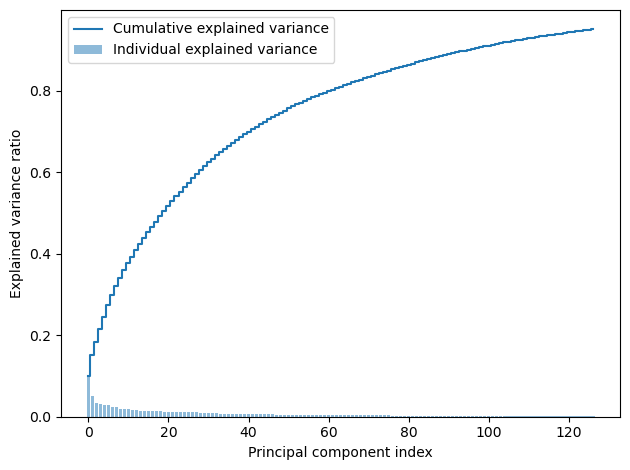

In [73]:
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, 
        alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_variance)), cum_sum_variance, 
         where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [74]:
pca.explained_variance_ratio_[:50].sum()

0.751081180702905

In [75]:
pca.explained_variance_ratio_[:150].sum()

0.9502318635682966

In [76]:
clf = RandomForestClassifier(max_depth=10, # max number of questions to ask
                             min_samples_split=20, # amount of rows still considered at every question
                             min_samples_leaf =20, # ultimate answer based on at least this many rows
                             max_samples=0.8, # fraction of X-train to use in each tree
                             random_state=42)
clf.fit(X_train_pca, y_upsampled)
print('Accuracy Train : ', clf.score(X_train_pca, y_upsampled))
print('Accuracy Test : ', clf.score(X_test_pca, y_test))

y_pred = clf.predict(X_test_pca)

print('y_test')
display(y_test.value_counts())
print('confusion_matrix')
display(confusion_matrix(y_test, y_pred))

Accuracy Train :  0.9381506726209404
Accuracy Test :  0.8440733154771283
y_test


TARGET_B
0    18050
1      991
Name: count, dtype: int64

confusion_matrix


array([[15898,  2152],
       [  817,   174]], dtype=int64)

In [77]:
##               Predicted 0   Predicted 1
## Actual 0        TN                    FP
## Actual 1        FN                    TP

In [78]:
# tn - true negative
# fp - false positive
# you want to maximise TN and TP

### Apply the model on the entire Dataset, post cleaning to predict Target B - will they donate or not

In [79]:
X = concat_df.drop(['TARGET_B', 'TARGET_D'],axis =1)
y = concat_df['TARGET_B']

In [80]:
y.value_counts(dropna = False)

TARGET_B
0    90379
1     4822
Name: count, dtype: int64

In [81]:
# scale, encode. transform using PCA (not fit), and then predict: y_pred = clf.predict(X)

In [82]:
X_num = X.select_dtypes(include = np.number)
X_cat = X.select_dtypes(include = object)

In [83]:
X_scaled = transformer.transform(X_num)
X_scaled =  pd.DataFrame(X_scaled, columns = X_num.columns)
X_scaled.shape

(95201, 315)

In [84]:
X_encod = encoder.transform(X_cat)
X_encod = pd.DataFrame(X_encod.toarray(), columns = encoder.get_feature_names_out(X_train_cat.columns))
X_encod.shape

(95201, 118)

In [85]:
X = pd.concat([X_scaled,X_encod], axis = 1)
X.shape

(95201, 433)

In [86]:
X_pca = pca.transform(X)

In [87]:
y_pred = clf.predict(X_pca)

In [88]:
X['predictions'] = y_pred

In [89]:
X['targetB'] = y

In [90]:
X.targetB.value_counts(dropna = False)

targetB
0.0    90179
1.0     4811
NaN      211
Name: count, dtype: int64

In [91]:
X.targetB = X.targetB.fillna(0)

In [92]:
# export X to csv
X.to_csv('X1_03_24.csv', index=False)

## Lab | Final Regression model to predict $$

In [93]:
df_TARGET_B = concat_df[concat_df.TARGET_B == 1]
df_TARGET_B.shape

(4822, 335)

In [125]:
df_TARGET_B.head()

,STATE,CLUSTER,HOMEOWNR,GENDER,DATASRCE,RFA_2R,RFA_2A,GEOCODE2,DOMAIN_A,DOMAIN_B,ODATEW_YR,MINRDATE_YR,MINRDATE_MM,MAXRDATE_YR,MAXRDATE_MM,LASTDATE_YR,LASTDATE_MM,FIRSTDATE_YR,FIRSTDATE_MM,AGE,INCOME,WEALTH1,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,WEALTH2,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,CARDPROM,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,CLUSTER2,TARGET_B,TARGET_D
20,other,12,H,F,3,L,D,A,S,1,87,88,1,94,4,96,3,87,1,62.000000,3,8,10,2,25,40,27,11,4,1,9,2707,672,929,99,0,0,45,55,97,1,0,2,1,0,0,0,0,1,0,0,1,0,0,0,35,42,43,37,47,50,27,34,43,23,9,20,27,16,8,6,15,15,13,37,21,14,16,8,15,23,30,47,29,11,2,55,10,13,22,190,267,89,49,1,10,10,8,8,8,0,902,960,8,8,88,12,97,3,11,42,72,60,34,79,21,8,1,7,12,21,5,21,58,17,0,1,0,0,4,35,74,99,0,1,64,63,62,14,4,2,8,0,5,1,7,0,95,96,96,96,5120.0,107.0,613.0,468,501,540,580,20328,6,8,19,23,23,11,7,1,2,4,6,13,27,25,14,8,1,1,14,2,66,1,61,39,20,74,17,2,2,0,0,0,2,4,1,75,20,21,1,67,71,82,62,80,60,80,65,99,0,1,21,20,8,11,17,1,1,10,0,5,3,2,1,0,0,3,23,5,2,4,12,7,3,2,1,14,12,7,5,11,4,1,4,70,10,0,140,5,3,24,21,9,32,7,3,23,3,16,7,1,2,0,12,25,3,40,20,27,7,0,0,2,12,0,0,3,1,4,1,0,0,0,4,0,1,58,95,1,0,4,95,69,23,4,13,2,17,35,91,99,1,12,3,93,0,5,1,0,1,99,1,97,99,99,9,2,6,3,26,65,5,12,61.0,15,10,2.0,7.0,5.0,12,4.066667,82943,1,3,3,1,4.0
30,TX,35,H,M,3,L,D,A,T,1,90,90,4,93,1,95,12,90,4,61.611649,5,9,0,1,37,58,16,8,1,5,9,2147,591,640,99,0,0,49,51,94,2,0,3,5,1,0,1,1,0,0,0,3,0,0,2,29,36,37,27,38,40,37,46,37,17,8,34,34,15,6,2,1,18,21,31,19,11,5,0,3,7,23,71,47,15,6,77,5,1,17,286,334,99,99,0,0,0,0,0,0,0,1002,1166,7,5,97,3,96,4,3,63,92,88,59,97,3,4,1,3,5,4,1,30,60,4,1,2,0,4,15,50,94,99,2,0,91,70,72,20,4,0,0,0,3,0,0,0,78,83,99,99,2920.0,201.0,618.0,633,638,652,663,19703,2,5,1,17,48,19,7,0,1,3,4,0,16,51,19,7,0,1,5,0,65,3,74,26,25,89,9,0,0,0,0,0,1,2,1,82,34,42,22,70,82,98,67,97,66,68,61,99,99,0,34,23,4,10,12,0,2,9,0,4,1,1,0,0,4,2,25,5,2,4,8,8,8,0,3,10,8,9,4,8,1,5,5,76,4,1,160,0,1,12,25,10,39,13,5,33,6,25,7,1,1,0,19,37,2,58,11,16,10,0,4,1,15,0,0,3,2,0,2,0,0,0,1,0,3,48,97,1,1,1,99,91,24,3,6,6,57,85,95,95,5,0,0,75,0,20,0,0,5,96,4,90,99,99,12,4,1,6,10,24,0,2,68.0,11,6,2.0,10.0,7.0,9,6.181818,190313,1,3,14,1,7.0
45,other,24,H,F,3,L,D,C,C,1,86,93,12,94,4,96,2,87,4,66.000000,5,9,5,0,33,24,39,6,5,1,9,2160,683,900,89,0,11,48,52,99,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,42,47,49,40,48,50,20,33,42,25,7,14,23,21,17,13,5,14,13,33,22,18,24,7,22,22,43,35,19,6,1,72,7,5,16,165,240,69,58,1,28,27,4,0,0,0,1282,1399,5,4,96,4,9

In [94]:
X2 = df_TARGET_B.drop(['TARGET_B', 'TARGET_D'],axis =1)
y2 = df_TARGET_B['TARGET_D']
print(y2.shape)
X2.shape

(4822,)


(4822, 333)

### Split & Transform

In [95]:
X_trained, X_tested, y_trained, y_tested = train_test_split(X2, y2, test_size=0.2, random_state=5)

In [96]:
X_trained_num = X_trained.select_dtypes(include = np.number)
X_trained_cat = X_trained.select_dtypes(include = object)
X_tested_num = X_tested.select_dtypes(include = np.number)
X_tested_cat = X_tested.select_dtypes(include = object)

In [97]:
transformer = MinMaxScaler().fit(X_trained_num)
x_trained_normalized = transformer.transform(X_trained_num)
print(x_trained_normalized.shape)
x_trained_normalized
x_trained_scaled = pd.DataFrame(x_trained_normalized, columns=X_trained_num.columns)

(3857, 315)


In [98]:
x_tested_normalized = transformer.transform(X_tested_num)
print(x_tested_normalized.shape)
x_tested_normalized
x_tested_scaled = pd.DataFrame(x_tested_normalized, columns=X_tested_num.columns)

(965, 315)


### Encoding

In [99]:
encoder = OneHotEncoder(drop = 'first')

X_trained_cat_encoded = encoder.fit_transform(X_trained_cat)
X_tested_cat_encoded = encoder.transform(X_tested_cat)

X_trained_cat_encoded_df = pd.DataFrame(X_trained_cat_encoded.toarray(), columns=encoder.get_feature_names_out(X_trained_cat.columns))
X_tested_cat_encoded_df = pd.DataFrame(X_tested_cat_encoded.toarray(), columns=encoder.get_feature_names_out(X_trained_cat.columns))

X_trained = pd.concat([x_trained_scaled, X_trained_cat_encoded_df], axis=1)
X_tested = pd.concat([x_tested_scaled, X_tested_cat_encoded_df], axis=1)

In [100]:
X_trained.shape

(3857, 433)

In [101]:
X_tested.shape

(965, 433)

In [102]:
y_trained.shape

(3857,)

In [103]:
y_tested.shape

(965,)

### Modeling pipline

In [104]:
model1 = DecisionTreeRegressor()
model2 = LinearRegression()
model3 = KNeighborsRegressor()

In [105]:
model_pipeline = [model1, model2, model3]
model_names = ['Decision Tree Regressor', 'Linear Regression', 'KNN']

scores = {}
for model, model_name in zip(model_pipeline, model_names):
    mean_score = np.mean(cross_val_score(model, X_trained, y_trained, cv=5))
    scores[model_name] = mean_score
print(scores)

{'Decision Tree Regressor': -0.04708458653908483, 'Linear Regression': 0.284253498479775, 'KNN': 0.06454639511377443}


### Linear Regression

In [127]:
LR = LRN()    
LR.fit(X_trained, y_trained)  
y_pred_linreg = LR.predict(X_tested)
# y_pred_linreg

In [116]:
print ('train R2: {} -- test R2: {}'.format(LR.score(X_trained, y_trained),
                                            LR.score(X_tested, y_tested)))

train R2: 0.5864112888042213 -- test R2: 0.41597938339958607


In [118]:
from sklearn.metrics import mean_squared_error as mse


train_mse = mse(LR.predict(X_trained), y_trained)
test_mse = mse(y_pred_linreg, y_tested)

print ('train MSE: {} -- test MSE: {}'.format(train_mse, test_mse))

train MSE: 70.55623443426705 -- test MSE: 53.93444886532851


In [119]:
print ('train RMSE: {} -- test RMSE: {}'.format(train_mse**.5, test_mse**.5))

train RMSE: 8.39977585619206 -- test RMSE: 7.344007684182289


In [122]:
train_mae = mae(LR.predict(X_trained), y_trained)
test_mae = mae(LR.predict(X_tested), y_tested)

print ('train MAE: {} -- test MAE: {}'.format(train_mse, test_mse))

train MAE: 70.55623443426705 -- test MAE: 53.93444886532851


In [130]:
# y_pred = clf.predict(X2)
# print(y_pred)

In [123]:
print(y_pred)

[0 0 0 ... 0 1 0]


In [131]:
# print('number of predicted donors:',X2['pred_amount'].count(),'; sum of predicted amount:',X2['pred_amount'].sum())
